<a href="https://colab.research.google.com/github/kadilrahman/Depth-estimation-FCRN-/blob/master/Dissertation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Monocular depth estimaion on outdoor environment**

This dissertation aims to achieve SOTA prediction of ground truth using RBG image of outdoor scenario. I have created a complex FCRN model in order to produce well defined depth maps. The dataset used is KITTI, which is a prime dataset for experimenting on outdoor environment.


## *DATA PREPERATION*
Right preparation of dataset is one of the keys to accuracy. KITTI dataset has its own obstacles when it comes to arranging the RBG along with its corresponding ground truth. So below we will deal one by one.

1. Downloading and unzipping dataset
2. Clearing unnecessary files to create space
3. Splitting dataset into seperate training, validation and test text documents


In [ ]:
!mkdir GAFCRN
%cd GAFCRN
!mkdir dataset
%cd dataset

/content/GAFCRN
/content/GAFCRN/dataset


In [ ]:
!gdown 1DeEP5KhSSaggKbyXwDx_Gcdf7tZriBEG

Downloading...
From: https://drive.google.com/uc?id=1DeEP5KhSSaggKbyXwDx_Gcdf7tZriBEG
To: /content/GAFCRN/dataset/kitti_archives_to_download.txt
100% 3.47k/3.47k [00:00<00:00, 17.9MB/s]


In [ ]:
import requests
import os

# Function to download a zip file
def download_file(url, save_path):
    response = requests.get(url, stream=True)
    with open(save_path, 'wb') as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)

with open('kitti_archives_to_download.txt') as f:
    urls = f.read().splitlines()

os.makedirs('kitti_data', exist_ok=True)

# Download and save each zip file
for url in urls:
    filename = url.split('/')[-1]
    save_path = os.path.join('kitti_data', filename)
    download_file(url, save_path)

In [ ]:
import os
import zipfile

# Function to extract a zip file
def extract_zip(zip_path, extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

folder_path = 'kitti_data'

zip_files = [file for file in os.listdir(folder_path) if file.endswith('.zip')]

for zip_file in zip_files:
    zip_path = os.path.join(folder_path, zip_file)
    extract_to = os.path.join(folder_path, zip_file.replace('.zip', ''))

    extract_zip(zip_path, extract_to)

    # Delete the extracted zip file
    os.remove(zip_path)
    print(f"Extracted and deleted: {zip_file}")



Extracted and deleted: 2011_09_29_drive_0004_sync.zip
Extracted and deleted: 2011_09_26_drive_0064_sync.zip
Extracted and deleted: 2011_09_29_drive_0071_sync.zip
Extracted and deleted: 2011_09_26_drive_0027_sync.zip
Extracted and deleted: 2011_09_26_drive_0001_sync.zip
Extracted and deleted: 2011_09_26_drive_0029_sync.zip
Extracted and deleted: 2011_09_26_drive_0052_sync.zip
Extracted and deleted: 2011_10_03_calib.zip
Extracted and deleted: 2011_09_26_drive_0039_sync.zip
Extracted and deleted: 2011_10_03_drive_0027_sync.zip
Extracted and deleted: 2011_09_28_calib.zip
Extracted and deleted: 2011_09_26_drive_0060_sync.zip
Extracted and deleted: 2011_09_29_calib.zip
Extracted and deleted: 2011_09_30_drive_0020_sync.zip
Extracted and deleted: 2011_09_26_drive_0002_sync.zip
Extracted and deleted: 2011_09_26_drive_0106_sync.zip
Extracted and deleted: 2011_09_28_drive_0001_sync.zip
Extracted and deleted: 2011_09_30_drive_0034_sync.zip
Extracted and deleted: 2011_09_26_drive_0013_sync.zip
Extr

In [ ]:
import os


parent_directory = '/content/GAFCRN/dataset/kitti_data'

# Function to delete specific folders from stereo images which are not required recursively
def delete_folders(directory):
    for root, dirs, files in os.walk(directory, topdown=False):
        for dir_name in dirs:
            if dir_name == 'image_00' or dir_name == 'image_01' or dir_name == 'image_02':
                folder_path = os.path.join(root, dir_name)
                print(f"Deleting folder: {folder_path}")
                try:

                    import send2trash
                    send2trash.send2trash(folder_path)

                except Exception as e:
                    print(f"Error deleting folder: {e}")

# Call the function to start the deletion process
delete_folders(parent_directory)

Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_29_drive_0071_sync/2011_09_29/2011_09_29_drive_0071_sync/image_01
Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_29_drive_0071_sync/2011_09_29/2011_09_29_drive_0071_sync/image_00
Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_29_drive_0071_sync/2011_09_29/2011_09_29_drive_0071_sync/image_02
Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_28_drive_0001_sync/2011_09_28/2011_09_28_drive_0001_sync/image_01
Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_28_drive_0001_sync/2011_09_28/2011_09_28_drive_0001_sync/image_00
Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_28_drive_0001_sync/2011_09_28/2011_09_28_drive_0001_sync/image_02
Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_26_drive_0039_sync/2011_09_26/2011_09_26_drive_0039_sync/image_01
Deleting folder: /content/GAFCRN/dataset/kitti_data/2011_09_26_drive_0039_sync/2011_09_26/2011_09_26_drive_0039_sync/i

In [ ]:
%cd '/content/GAFCRN/dataset'


/content/GAFCRN/dataset


In [ ]:
# These are already inpainted earlier and saved.

!gdown 1HV53l0ftTUEAMGi4GI7_XC8xkDK6C7bc
!unzip fill_ground.zip

Streaming output truncated to the last 5000 lines.
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000123.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000124.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000125.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000126.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000127.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000128.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000129.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000130.png  
  inflating: ground_truth/val/2011_09_26_drive_0036_sync/proj_depth/groundtruth/image_02/0000000131.p

In [ ]:
# These are the sparse annotated depth which require inpainting

# !gdown 1EdunRfA4rrTUqxQRxmKl1Tq5dr0yPon8
# !unzip data_depth_annotated.zip

In [ ]:
import os

# Deleting unwanted zip files
folder_path = '/content/GAFCRN/dataset'

zip_files = [file for file in os.listdir(folder_path) if file.endswith('.zip')]

for zip_file in zip_files:
    zip_path = os.path.join(folder_path, zip_file)
    os.remove(zip_path)
    print(f"Deleted: {zip_file}")

Deleted: fill_ground.zip


In [ ]:
# Deleting the png with an error
import os

file_path = "/content/GAFCRN/dataset/ground_truth/train/2011_09_26_drive_0001_sync/proj_depth/groundtruth/image_03/0000000005.png"

if os.path.exists(file_path):
    os.remove(file_path)
    print(f"File {file_path} has been deleted.")
else:
    print(f"File {file_path} does not exist.")


File /content/GAFCRN/dataset/ground_truth/train/2011_09_26_drive_0001_sync/proj_depth/groundtruth/image_03/0000000005.png has been deleted.


In [ ]:
# Creating a text file holding paths to kitti_data
import os

# Define the path to the kitti_data folder
kitti_data_path = '/content/GAFCRN/dataset/kitti_data'

png_file_paths = []


def is_desired_file(filename):
    file_number = int(filename.split('.')[0])
    return 5 <= file_number <= 102


for root, _, files in os.walk(kitti_data_path):
    for file in files:
        if file.lower().endswith('.png') and is_desired_file(file):
            png_file_path = os.path.join(root, file)
            png_file_paths.append(png_file_path)


png_file_paths.sort()

output_txt_file = '/content/GAFCRN/dataset/kitti_data.txt'

# Write the PNG file paths to the TXT file
with open(output_txt_file, 'w') as f:
    for path in png_file_paths:
        f.write(path + '\n')

print(f"The PNG file paths have been written to {output_txt_file}.")


The PNG file paths have been written to /content/GAFCRN/dataset/kitti_data.txt.


In [ ]:
# Creating a text file holding paths to ground_truth

import os

# Define the path to ground_truth folder
ground_truth_path = '/content/GAFCRN/dataset/ground_truth'

png_file_paths = []

def is_desired_file(filename):
    file_number = int(filename.split('.')[0])
    return 5 <= file_number <= 102


for root, _, files in os.walk(ground_truth_path):
    for file in files:
        if file.lower().endswith('.png') and is_desired_file(file):
            png_file_path = os.path.join(root, file)
            png_file_paths.append(png_file_path)

png_file_paths.sort()

output_txt_file = '/content/GAFCRN/dataset/ground_truth.txt'

# Write the PNG file paths to the TXT file
with open(output_txt_file, 'w') as f:
    for path in png_file_paths:
        f.write(path + '\n')

print(f"The PNG file paths have been written to {output_txt_file}.")

The PNG file paths have been written to /content/GAFCRN/dataset/ground_truth.txt.


In [ ]:
# Creating a text file holding corresponding rbg and depth

def find_matching_pairs(kitti_data_paths, ground_truth_paths):
    matching_pairs = []

    for kitti_path in kitti_data_paths:
        kitti_parts = kitti_path.split('/')
        kitti_png_name = kitti_parts[-1]

        for gt_path in ground_truth_paths:
            gt_parts = gt_path.split('/')
            gt_png_name = gt_parts[-1]


            if kitti_png_name == gt_png_name:

                if kitti_parts[-3] == gt_parts[-2] and kitti_parts[-6] == gt_parts[-5]:
                    matching_pairs.append((kitti_path, gt_path))
                    break

    return matching_pairs


def read_txt_file(file_path):
    with open(file_path, 'r') as f:
        lines = f.read().splitlines()
    return lines

kitti_data_paths = read_txt_file('/content/GAFCRN/dataset/kitti_data.txt')
ground_truth_paths = read_txt_file('/content/GAFCRN/dataset/ground_truth.txt')

matching_pairs = find_matching_pairs(kitti_data_paths, ground_truth_paths)

matched_data_file = '/content/GAFCRN/dataset/matched_data.txt'

# Write the matched pairs into the new text file
with open(matched_data_file, 'w') as f:
    for kitti_path, gt_path in matching_pairs:
        f.write(kitti_path + '\n')
        f.write(gt_path + '\n')

print(f"Matching RGB image paths and ground truth depth map paths have been written to {matched_data_file}.")

Matching RGB image paths and ground truth depth map paths have been written to /content/GAFCRN/dataset/matched_data.txt.


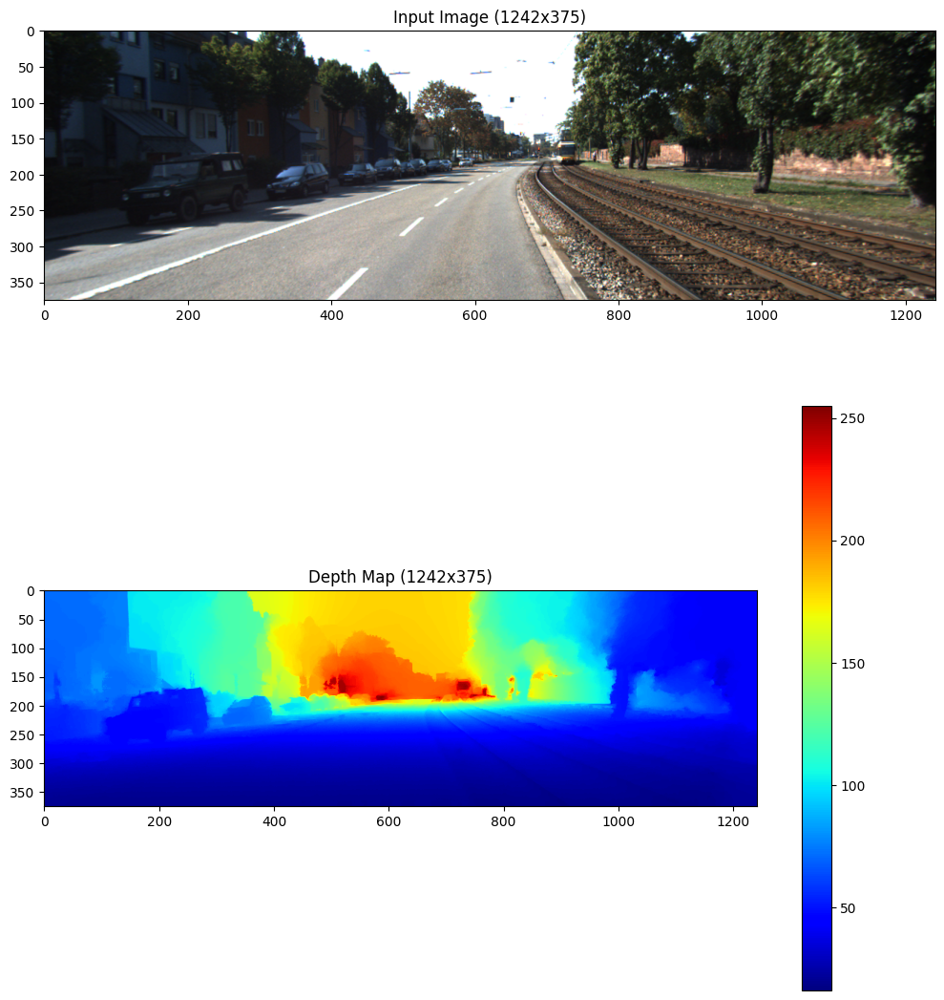

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Read the contents of matched_data.txt
def read_matched_data_file(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
    return [line.strip() for line in lines]

matched_data_paths = read_matched_data_file('/content/GAFCRN/dataset/matched_data.txt')  # Replace with the actual path

# Load the first image and depth paths
image_path = matched_data_paths[0]
depth_path = matched_data_paths[1]

# Load the image and depth
image = tf.io.read_file(image_path)
image = tf.image.decode_image(image, channels=3)  # Adjust channels if necessary

depth = tf.io.read_file(depth_path)
depth = tf.image.decode_image(depth, channels=1)

# Get dimensions of image and depth
image_height, image_width, _ = image.shape
depth_height, depth_width, _ = depth.shape

# Display the image and depth with dimensions
plt.figure(figsize=(10, 12))

# Display the image
plt.subplot(2, 1, 1)
plt.imshow(image.numpy())
plt.title(f"Input Image ({image_width}x{image_height})")
# plt.axis('off')

# Display the depth
plt.subplot(2, 1, 2)
plt.imshow(tf.squeeze(depth).numpy(), cmap='jet')
plt.title(f"Depth Map ({depth_width}x{depth_height})")
plt.colorbar()

plt.tight_layout()
plt.show()


In [ ]:
# splitting matched_data.txt into train, test and val.
import os
import random


matching_pairs = []
matched_data_file = '/content/GAFCRN/dataset/matched_data.txt'
with open(matched_data_file, 'r') as f:
    lines = f.readlines()
    lines = [line.strip() for line in lines]
    for i in range(0, len(lines), 2):
        matching_pairs.append((lines[i], lines[i+1]))


random.shuffle(matching_pairs)

train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

total_samples = len(matching_pairs)
train_samples = int(train_ratio * total_samples)
val_samples = int(val_ratio * total_samples)
test_samples = total_samples - train_samples - val_samples


train_set = matching_pairs[:train_samples]
val_set = matching_pairs[train_samples:train_samples + val_samples]
test_set = matching_pairs[train_samples + val_samples:]

# Specify the directory to save the text files
output_directory = '/content/GAFCRN/dataset'

# Save sets into separate text files
def save_set_to_file(file_path, data_set):
    with open(file_path, 'w') as f:
        for kitti_path, gt_path in data_set:
            f.write(kitti_path + '\n')
            f.write(gt_path + '\n')


os.makedirs(output_directory, exist_ok=True)

# Save the sets to the specified directory
save_set_to_file(os.path.join(output_directory, 'train_set.txt'), train_set)
save_set_to_file(os.path.join(output_directory, 'val_set.txt'), val_set)
save_set_to_file(os.path.join(output_directory, 'test_set.txt'), test_set)


In [ ]:
#Only run the inapinting code if you have downlaoded the non-filled "annotated_data_depth.zip"

## **Inpainting**
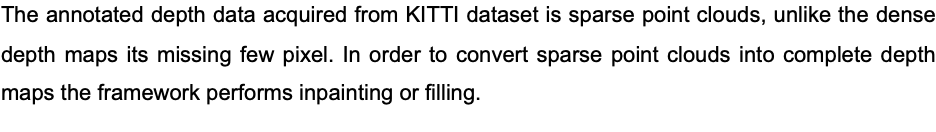

> Sparse point clouds (before inpainting)


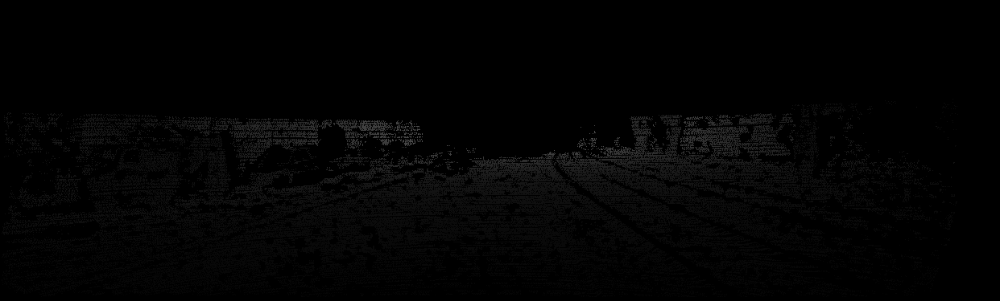

> dense depth map (after inpainting)

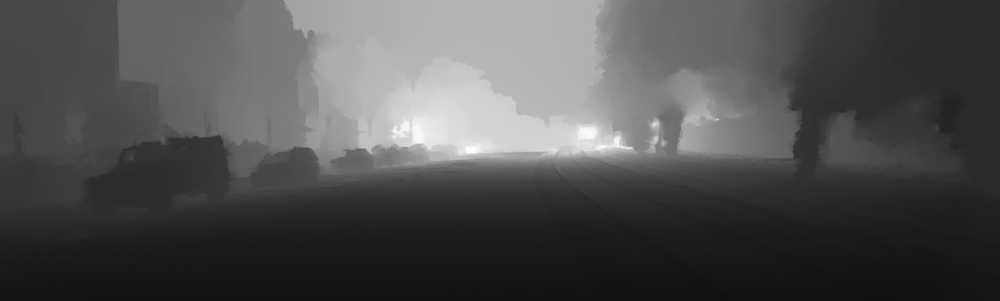

In [ ]:
import skimage
import scipy
import numpy as np
from scipy.sparse.linalg import spsolve

#Inpainting function taken from alhashim el al.
def fill_depth_inpainting(imgRgb, imgDepthInput, alpha=1):
    imgIsNoise = imgDepthInput == 0
    maxImgAbsDepth = np.max(imgDepthInput)
    imgDepth = imgDepthInput / maxImgAbsDepth
    imgDepth[imgDepth > 1] = 1
    (H, W) = imgDepth.shape
    numPix = H * W
    indsM = np.arange(numPix).reshape((W, H)).transpose()
    knownValMask = (imgIsNoise == False).astype(int)
    grayImg = skimage.color.rgb2gray(imgRgb)
    winRad = 1
    len_ = 0
    absImgNdx = 0
    len_window = (2 * winRad + 1) ** 2
    len_zeros = numPix * len_window

    cols = np.zeros(len_zeros) - 1
    rows = np.zeros(len_zeros) - 1
    vals = np.zeros(len_zeros) - 1
    gvals = np.zeros(len_window) - 1

    for j in range(W):
        for i in range(H):
            nWin = 0
            for ii in range(max(0, i - winRad), min(i + winRad + 1, H)):
                for jj in range(max(0, j - winRad), min(j + winRad + 1, W)):
                    if ii == i and jj == j:
                        continue

                    rows[len_] = absImgNdx
                    cols[len_] = indsM[ii, jj]
                    gvals[nWin] = grayImg[ii, jj]

                    len_ = len_ + 1
                    nWin = nWin + 1

            curVal = grayImg[i, j]
            gvals[nWin] = curVal
            c_var = np.mean((gvals[:nWin + 1] - np.mean(gvals[:nWin+ 1])) ** 2)

            csig = c_var * 0.6
            mgv = np.min((gvals[:nWin] - curVal) ** 2)
            if csig < -mgv / np.log(0.01):
                csig = -mgv / np.log(0.01)

            if csig < 2e-06:
                csig = 2e-06

            gvals[:nWin] = np.exp(-(gvals[:nWin] - curVal) ** 2 / csig)
            gvals[:nWin] = gvals[:nWin] / sum(gvals[:nWin])
            vals[len_ - nWin:len_] = -gvals[:nWin]

            # Now the self-reference (along the diagonal).
            rows[len_] = absImgNdx
            cols[len_] = absImgNdx
            vals[len_] = 1  # sum(gvals(1:nWin))

            len_ = len_ + 1
            absImgNdx = absImgNdx + 1

    vals = vals[:len_]
    cols = cols[:len_]
    rows = rows[:len_]
    A = scipy.sparse.csr_matrix((vals, (rows, cols)), (numPix, numPix))

    rows = np.arange(0, numPix)
    cols = np.arange(0, numPix)
    vals = (knownValMask * alpha).transpose().reshape(numPix)
    G = scipy.sparse.csr_matrix((vals, (rows, cols)), (numPix, numPix))

    A = A + G
    b = np.multiply(vals.reshape(numPix), imgDepth.flatten('F'))

    new_vals = spsolve(A, b)
    new_vals = np.reshape(new_vals, (H, W), 'F')

    denoisedDepthImg = new_vals * maxImgAbsDepth

    output = denoisedDepthImg.reshape((H, W)).astype('float32')
    output = np.multiply(output, (1 - knownValMask)) + imgDepthInput

    return output

In [ ]:
import skimage
import scipy
import numpy as np
from scipy.sparse.linalg import spsolve
import os


def read_matched_data_file(matched_data_file):
    with open(matched_data_file, 'r') as f:
        lines = f.read().splitlines()
    # Extract the corresponding pairs of RGB image paths and ground truth paths
    num_pairs = len(lines) // 2
    matched_pairs = [(lines[i], lines[i + 1]) for i in range(0, len(lines), 2)]
    return matched_pairs

def main():
    matched_data_file = '/content/GAFCRN/dataset/matched_data.txt'  # Replace with the path to your matched_data.txt file

    # Read the matched data file and extract the corresponding pairs
    matched_pairs = read_matched_data_file(matched_data_file)

    for kitti_path, gt_path in matched_pairs:
        # Load RGB image and ground truth depth map
        rgb_image = skimage.io.imread(kitti_path)
        ground_truth_depth = skimage.io.imread(gt_path)

        # Normalize the RGB image to the range [0, 1]
        rgb_image = rgb_image.astype('float32') / 255.0

        # Call the function for inpainting
        inpainted_depth = fill_depth_inpainting(rgb_image, ground_truth_depth)

        # Save the inpainted depth map by overwriting the existing ground truth
        skimage.io.imsave(gt_path, inpainted_depth)

if __name__ == "__main__":
    main()


## **MODEL ARCHITECTURE**

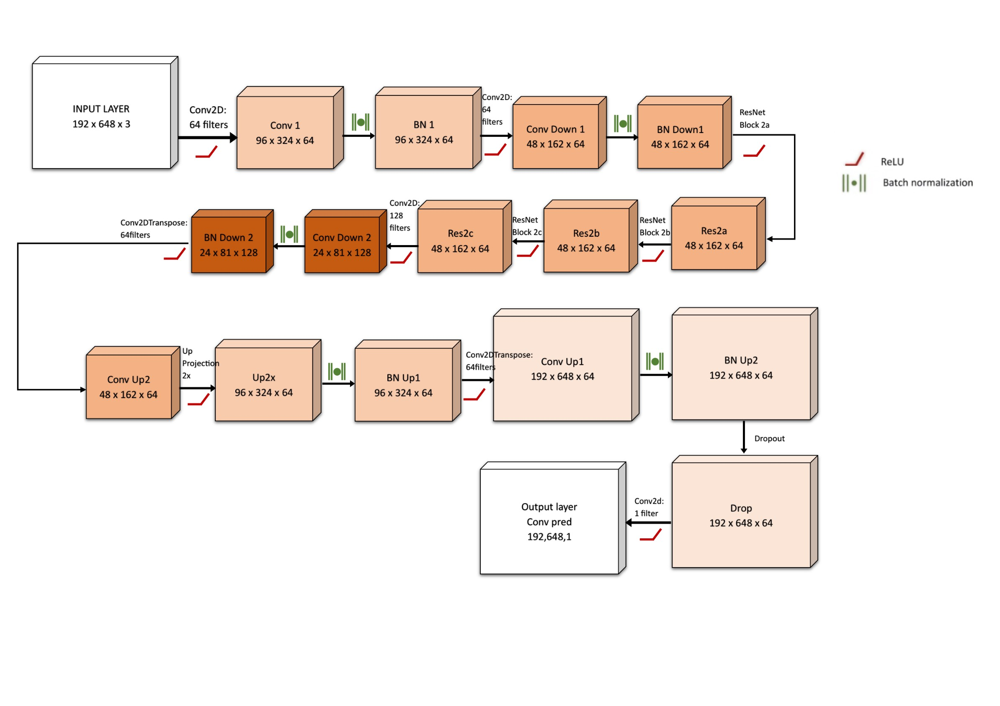


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Dropout, BatchNormalization

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, MaxPooling2D, Conv2DTranspose, Dropout, Activation

def resnet_block(input_tensor, filters, stage, block):
    conv_name_base = f'res{stage}{block}_branch'
    bn_name_base = f'bn{stage}{block}_branch'

    x = Conv2D(filters, (1, 1), padding='same', activation='relu', name=conv_name_base + '2a')(input_tensor)
    x = BatchNormalization(axis=3, name=bn_name_base + '2a')(x)

    x = Conv2D(filters, (3, 3), padding='same', activation='relu', name=conv_name_base + '2b')(x)
    x = BatchNormalization(axis=3, name=bn_name_base + '2b')(x)

    x = Conv2D(4 * filters, (1, 1), padding='same', name=conv_name_base + '2c')(x)
    x = BatchNormalization(axis=3, name=bn_name_base + '2c')(x)

    if input_tensor.shape[-1] != 4 * filters:
        shortcut = Conv2D(4 * filters, (1, 1), padding='same', name=conv_name_base + '1')(input_tensor)
        shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(shortcut)
    else:
        shortcut = input_tensor

    x = tf.keras.layers.add([x, shortcut])
    x = Activation('relu')(x)
    return x

def up_projection(input_tensor, filters, stage):
    upconv_name_base = f'up{stage}'

    x = Conv2DTranspose(filters, (3, 3), strides=(2, 2), padding='same', name=upconv_name_base)(input_tensor)
    x = BatchNormalization(axis=3)(x)
    x = Activation('relu')(x)
    return x

def build_fcrn_model(input_shape):
    input_layer = Input(shape=input_shape, name='input')

    # Initial Convolution Layer
    x = Conv2D(64, (7, 7), strides=(2, 2), padding='same', activation='relu', name='conv1')(input_layer)
    x = BatchNormalization(axis=3, name='bn_conv1')(x)

    # Downsample using strided convolutions
    x = Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu', name='conv_downsample_1')(x)
    x = BatchNormalization(axis=3, name='bn_downsample_1')(x)

    x = resnet_block(x, 64, 2, 'a')
    x = resnet_block(x, 64, 2, 'b')
    x = resnet_block(x, 64, 2, 'c')

    x = Conv2D(128, (3, 3), strides=(2, 2), padding='same', activation='relu', name='conv_downsample_2')(x)
    x = BatchNormalization(axis=3, name='bn_downsample_2')(x)

    # Upsampling using Conv2DTranspose
    x = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='conv_upsample_2')(x)
    x = up_projection(x, 64, '2x')
    x = BatchNormalization(axis=3)(x)
    x = Activation('relu')(x)

    x = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', name='conv_upsample_1')(x)
    x = BatchNormalization(axis=3)(x)
    x = Activation('relu')(x)

    # Dropout and Convolution for prediction
    x = Dropout(0.5, name='drop')(x)
    x = Conv2D(1, (3, 3), activation=None, padding='same', name='ConvPred')(x)

    model = tf.keras.Model(inputs=input_layer, outputs=x, name='FCRN')
    return model

In [ ]:
# Set hyperparameters and input shape
input_shape = (192, 648, 3)  # Set your image dimensions and channels
batch_size = 8
num_epochs = 100
learning_rate = 0.001

import tensorflow as tf


from tensorflow.keras.metrics import Metric

class LogRMSE(Metric):
    def __init__(self, name="log_rmse", **kwargs):
        super(LogRMSE, self).__init__(name=name, **kwargs)
        self.log_rmse = self.add_weight(name="lr", initializer="zeros")

    def update_state(self, y_true, y_pred, sample_weight=None):
        log_rmse = tf.math.sqrt(tf.math.reduce_mean(tf.math.squared_difference(tf.math.log1p(y_true), tf.math.log1p(y_pred))))
        self.log_rmse.assign_add(log_rmse)

    def result(self):
        return self.log_rmse

    def reset_state(self):
        self.log_rmse.assign(0.0)

# Build your FCRN model
model = build_fcrn_model(input_shape)

# Compile your model using MAE loss function and RMSE log metric
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate), loss='mae', metrics=[LogRMSE()])


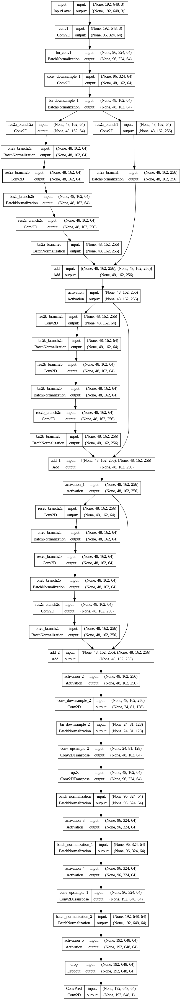

In [ ]:
!pip install graphviz
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, Dropout, BatchNormalization, Activation
from tensorflow.keras.utils import plot_model

# Specify the file name for saving the diagram
diagram_file = '/content/GAFCRN/dataset/model_diagram.png'

# Plot and save the model diagram to the specified file
plot_model(model, to_file=diagram_file, show_shapes=True, show_layer_names=True)

# Alternatively, you can display the model diagram in a Jupyter Notebook
plot_model(model, show_shapes=True, show_layer_names=True)


## **PRE-PROCESSING**

In [ ]:
import tensorflow as tf
import numpy as np

def load_and_preprocess_image(image_path):
    # Load the image using TensorFlow
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3)

    # Resize the image to your desired input dimensions
    image = tf.image.resize(image, (192, 648))

    # Normalize pixel values
    image = image / 255.0

    return image

def load_and_preprocess_depth(depth_path):
    # Load the depth map using TensorFlow
    depth = tf.io.read_file(depth_path)
    depth = tf.image.decode_image(depth, channels=1)

    # Resize the depth map to your desired input dimensions
    depth = tf.image.resize(depth, (192, 648))

    # Normalize values
    depth = depth / 255.0

    return depth

# Load and preprocess training data
train_image_paths = []
train_depth_paths = []

with open('/content/GAFCRN/dataset/train_set.txt', 'r') as file:
    lines = file.read().splitlines()
    for i in range(0, len(lines), 2):
        train_image_paths.append(lines[i])
        train_depth_paths.append(lines[i + 1])

# Initialize empty lists to store preprocessed images and depths
train_images = []
train_depths = []

for image_path, depth_path in zip(train_image_paths, train_depth_paths):
    print("Image Path:", image_path)
    print("Depth Path:", depth_path)

    try:
        # Load and preprocess the image and depth map
        image = load_and_preprocess_image(image_path)
        depth = load_and_preprocess_depth(depth_path)

        train_images.append(image)
        train_depths.append(depth)
    except Exception as e:
        print("Error:", e)
        print("Skipped:", depth_path)


# Convert lists to TensorFlow tensors
train_images = tf.convert_to_tensor(train_images, dtype=tf.float32)
train_depths = tf.convert_to_tensor(train_depths, dtype=tf.float32)

# Load and preprocess testing data
test_image_paths = []
test_depth_paths = []

with open('/content/GAFCRN/dataset/test_set.txt', 'r') as file:
    lines = file.read().splitlines()
    for i in range(0, len(lines), 2):
        test_image_paths.append(lines[i])
        test_depth_paths.append(lines[i + 1])

# Initialize empty lists to store preprocessed images and depths
test_images = []
test_depths = []

for image_path, depth_path in zip(test_image_paths, test_depth_paths):
    print("Image Path:", image_path)
    print("Depth Path:", depth_path)

    try:
        # Load and preprocess the image and depth map
        image = load_and_preprocess_image(image_path)
        depth = load_and_preprocess_depth(depth_path)

        test_images.append(image)
        test_depths.append(depth)
    except Exception as e:
        print("Error:", e)
        print("Skipped:", depth_path)



# Convert lists to TensorFlow tensors
test_images = tf.convert_to_tensor(test_images, dtype=tf.float32)
test_depths = tf.convert_to_tensor(test_depths, dtype=tf.float32)


# Load and preprocess validation data
val_image_paths = []
val_depth_paths = []

with open('/content/GAFCRN/dataset/val_set.txt', 'r') as file:
    lines = file.read().splitlines()
    for i in range(0, len(lines), 2):
        val_image_paths.append(lines[i])
        val_depth_paths.append(lines[i + 1])

# Initialize empty lists to store preprocessed images and depths
val_images = []
val_depths = []

for image_path, depth_path in zip(val_image_paths, val_depth_paths):
    print("Image Path:", image_path)
    print("Depth Path:", depth_path)

    try:
        # Load and preprocess the image and depth map
        image = load_and_preprocess_image(image_path)
        depth = load_and_preprocess_depth(depth_path)

        val_images.append(image)
        val_depths.append(depth)
    except Exception as e:
        print("Error:", e)
        print("Skipped:", depth_path)

# Convert lists to TensorFlow tensors
val_images = tf.convert_to_tensor(val_images, dtype=tf.float32)
val_depths = tf.convert_to_tensor(val_depths, dtype=tf.float32)



Streaming output truncated to the last 5000 lines.
Image Path: /content/GAFCRN/dataset/kitti_data/2011_10_03_drive_0027_sync/2011_10_03/2011_10_03_drive_0027_sync/image_03/data/0000000080.png
Depth Path: /content/GAFCRN/dataset/ground_truth/train/2011_10_03_drive_0027_sync/proj_depth/groundtruth/image_03/0000000080.png
Image Path: /content/GAFCRN/dataset/kitti_data/2011_09_30_drive_0034_sync/2011_09_30/2011_09_30_drive_0034_sync/image_03/data/0000000047.png
Depth Path: /content/GAFCRN/dataset/ground_truth/train/2011_09_30_drive_0034_sync/proj_depth/groundtruth/image_03/0000000047.png
Image Path: /content/GAFCRN/dataset/kitti_data/2011_09_29_drive_0026_sync/2011_09_29/2011_09_29_drive_0026_sync/image_03/data/0000000035.png
Depth Path: /content/GAFCRN/dataset/ground_truth/val/2011_09_29_drive_0026_sync/proj_depth/groundtruth/image_03/0000000035.png
Image Path: /content/GAFCRN/dataset/kitti_data/2011_09_28_drive_0001_sync/2011_09_28/2011_09_28_drive_0001_sync/image_03/data/0000000015.png


In [ ]:
!mkdir '/content/GAFCRN/dataset/logs'
from tensorflow.keras.callbacks import TensorBoard


# Define the log directory for TensorBoard
log_dir = "/content/GAFCRN/dataset/logs"  # Change this to your desired log directory

# Create a TensorBoard callback
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


In [ ]:
# import shutil

# folder_path = '/content/GAFCRN/dataset/logs'
# shutil.rmtree(folder_path)


## **TRAINING**

In [ ]:

model.fit(train_images, train_depths, batch_size=batch_size, epochs=num_epochs, validation_data=(val_images, val_depths), callbacks=[tensorboard_callback])


Epoch 1/100
230/230 [==============================] - 87s 276ms/step - loss: 0.1656 - log_rmse: nan - val_loss: 0.1718 - val_log_rmse: 9.3720
Epoch 2/100
230/230 [==============================] - 60s 263ms/step - loss: 0.1185 - log_rmse: 28.8758 - val_loss: 0.1318 - val_log_rmse: 7.2894
Epoch 3/100
230/230 [==============================] - 60s 262ms/step - loss: 0.1070 - log_rmse: 26.4376 - val_loss: 0.1098 - val_log_rmse: 5.9734
Epoch 4/100
230/230 [==============================] - 60s 263ms/step - loss: 0.1013 - log_rmse: 25.1951 - val_loss: 0.1197 - val_log_rmse: 6.0589
Epoch 5/100
230/230 [==============================] - 60s 263ms/step - loss: 0.0974 - log_rmse: 24.2932 - val_loss: 0.1030 - val_log_rmse: 5.7758
Epoch 6/100
230/230 [==============================] - 60s 263ms/step - loss: 0.0924 - log_rmse: 23.1512 - val_loss: 0.1080 - val_log_rmse: 5.9828
Epoch 7/100
230/230 [==============================] - 60s 263ms/step - loss: 0.0896 - log_rmse: 22.4710 - val_loss: 0.091

In [ ]:
from tensorboard import notebook

# Start TensorBoard
notebook.start("--logdir /content/GAFCRN/dataset/logs")

<IPython.core.display.Javascript object>

## **EVALUATION**

In [ ]:
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt


# Perform predictions on testing images
predicted_depths = model.predict(test_images)

13/13 [==============================] - 7s 325ms/step


In [ ]:
import numpy as np

def rmse(y_true, y_pred):
    return np.sqrt(np.mean(np.square(y_true - y_pred)))

rmse_score = rmse(test_depths.numpy(), predicted_depths)
print("Root Mean Squared Error (RMSE):", rmse_score)

# Manually compute LogRMSE for test set
def log_rmse(y_true, y_pred):
    return np.sqrt(np.mean(np.square(np.log1p(y_true) - np.log1p(y_pred))))

test_log_rmse = log_rmse(test_depths.numpy(), predicted_depths)
print("Test LogRMSE: ", test_log_rmse)

# Calculate MAE for predictions
mae = np.mean(np.abs(predicted_depths - test_depths))
print("Mean Absolute Error (MAE) for Predictions:", mae)

# # Calculate RMS (Root Mean Squared) metric
# def rms_metric(y_true, y_pred):
#     return np.sqrt(np.mean(np.square(y_true - y_pred)))

# rms_score = rms_metric(test_depths.numpy(), predicted_depths)
# print("RMS Score:", rms_score)

import numpy as np

def relative_error(predicted_depths, ground_truth_depths):
    errors = np.abs(predicted_depths - ground_truth_depths) / ground_truth_depths
    rel = np.mean(errors)
    return rel

# Assuming 'predicted_depths' and 'test_depths' are your arrays of predicted and ground truth depth values
rel_score = relative_error(predicted_depths, test_depths.numpy())
print("Relative Error (REL):", rel_score)


# Calculate δi Threshold Accuracy
def threshold_accuracy(y_true, y_pred, threshold):
    diff = np.abs(y_true - y_pred)
    accuracy = np.mean(np.maximum(y_true / y_pred, y_pred / y_true) < threshold) * 100.0
    return accuracy

# Set the thresholds you want to calculate threshold accuracy for
thresholds = [1.25, 1.5625, 1.953125]

# Print header
print("Threshold Accuracy:")
print("| δi | Accuracy |")

# Calculate and print threshold accuracy for each threshold
for threshold in thresholds:
    threshold_acc = threshold_accuracy(test_depths.numpy(), predicted_depths, threshold)
    print(f"| {threshold} | {threshold_acc:.2f}% |")


Root Mean Squared Error (RMSE): 0.07381207
Test LogRMSE:  0.053577542
Mean Absolute Error (MAE) for Predictions: 0.04540273
Relative Error (REL): 0.21904288
Threshold Accuracy:
| δi | Accuracy |
| 1.25 | 72.71% |
| 1.5625 | 90.48% |
| 1.953125 | 95.90% |


In [ ]:
# Visualize the predicted and actual depth maps along with images
for i in range(len(predicted_depths)):
    input_image = test_images[i].numpy() * 255.0  # Convert back to 0-255 range
    actual_depth = tf.squeeze(test_depths[i], axis=-1).numpy()  # Convert to NumPy array and remove single-dimensional axis
    predicted_depth = tf.squeeze(predicted_depths[i], axis=-1).numpy()

    # Display the images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(input_image.astype(np.uint8))  # Convert to uint8 for display
    plt.title("Input Image")
    plt.axis('off')

    # Display the actual depth map
    plt.subplot(1, 3, 2)
    plt.imshow(actual_depth, cmap='jet')
    plt.title("Actual Depth Map")
    plt.colorbar()

    # Display the predicted depth map
    plt.subplot(1, 3, 3)
    plt.imshow(predicted_depth, cmap='jet')
    plt.title("Predicted Depth Map")
    plt.colorbar()

    plt.tight_layout()
    plt.show()




In [ ]:
import os

# Create a directory to save the results
results_dir = '/content/GAFCRN/results'
os.makedirs(results_dir, exist_ok=True)

# Loop through each sample
for i in range(len(predicted_depths)):
    input_image = test_images[i].numpy() * 255.0
    actual_depth = tf.squeeze(test_depths[i], axis=-1).numpy()
    predicted_depth = tf.squeeze(predicted_depths[i], axis=-1).numpy()

    # Create a subdirectory for each sample
    sample_dir = os.path.join(results_dir, f'sample_{i}')
    os.makedirs(sample_dir, exist_ok=True)

    # Save the images
    input_image_path = os.path.join(sample_dir, 'input_image.png')
    actual_depth_path = os.path.join(sample_dir, 'actual_depth.png')
    predicted_depth_path = os.path.join(sample_dir, 'predicted_depth.png')

    plt.imsave(input_image_path, input_image.astype(np.uint8))
    plt.imsave(actual_depth_path, actual_depth, cmap='jet')
    plt.imsave(predicted_depth_path, predicted_depth, cmap='jet')

print("Results saved successfully!")


Results saved successfully!
